### Importing necessary packages and modules

In [3]:
import pandas as pd #data analysis and manipulation
import numpy as np #mathematical operations on multidimensional arrays
import matplotlib.pyplot as plt #plotting
%matplotlib inline

import seaborn as sns #plotting
import datetime #timekeeping
import scipy

### Start time

In [2]:
print("Start Time: ", datetime.datetime.now())

Start Time:  2021-05-31 09:03:47.828597


## 01. Loading Dataset

In [4]:
df = pd.read_csv("MLAII_DataSet1.csv")

In [5]:
df.head()

,Alpha,Beta
0,25.0514,5.7475
1,26.6614,7.3414
2,25.2653,6.2466
3,25.2285,4.7447
4,25.7529,5.1564


#### The dataset has 2 columns, Alpha and Beta. Number of tuples is 3100. The ideal K value thus should be somewhere in the 30-40 ballpark.

In [6]:
df.shape

(3100, 2)

In [7]:
df.columns

Index(['Alpha', 'Beta'], dtype='object')

#### No null values and no duplicated tuples either. As we see futher below, no '0' values exist either.

In [8]:
df.isnull().sum()

Alpha    0
Beta     0
dtype: int64

In [9]:
df.duplicated().sum()

0

In [10]:
df.describe(percentiles = [0.005, 0.01, 0.05, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99, 0.995])

,Alpha,Beta
count,3100.000000,3100.000000
mean,16.739989,17.127637
std,7.325422,6.750086
min,2.907000,3.792500
0.5%,4.041900,4.645754
1%,4.296154,4.933300
5%,5.199640,6.328825
10%,6.067200,8.407910
25%,10.442950,10.969075
50%,16.483900,16.871450


In [11]:
df.dtypes

Alpha    float64
Beta     float64
dtype: object

In [12]:
df.isin([0]).any()

Alpha    False
Beta     False
dtype: bool

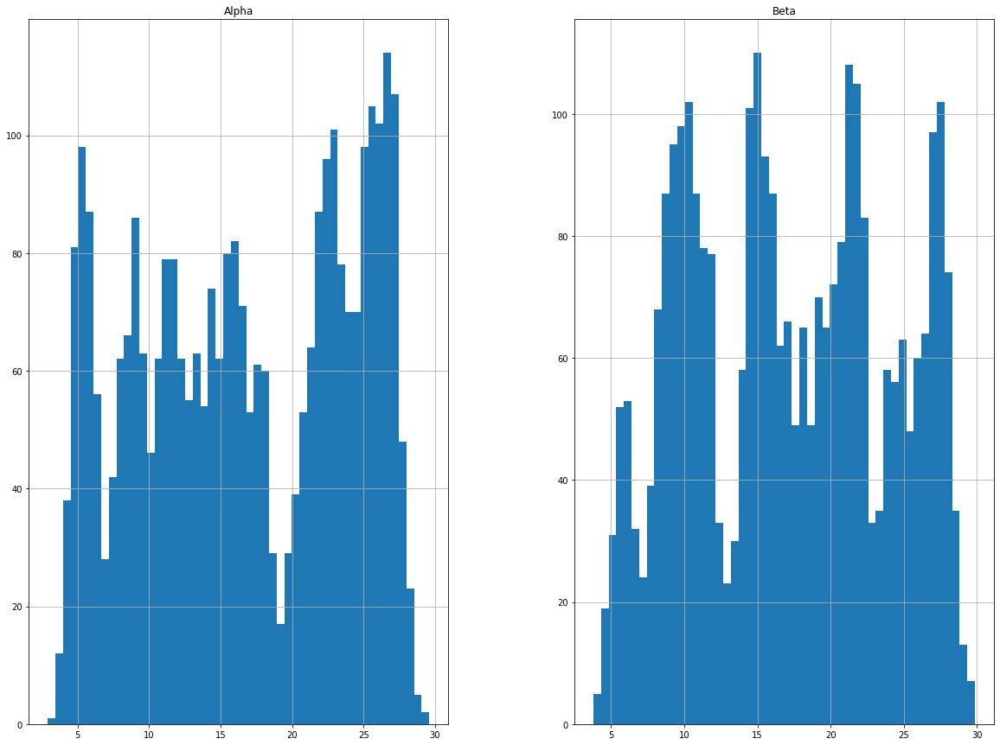

In [14]:
df.hist(bins = 50, figsize = (20, 15))
plt.show()

<AxesSubplot:>

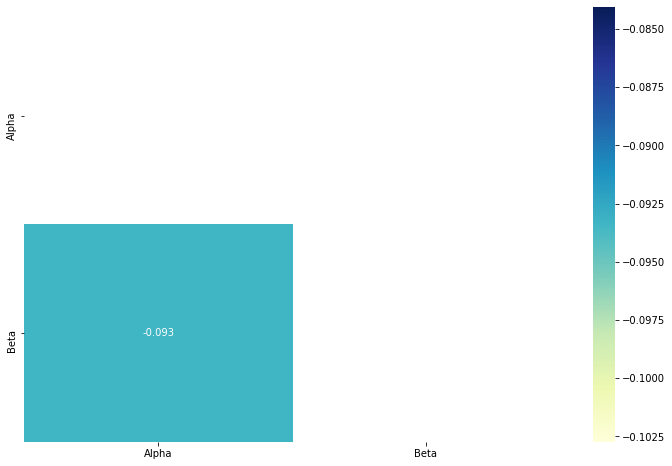

In [15]:
corr_mat = df.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr_mat, mask = np.triu(corr_mat), cmap="YlGnBu", annot = True)

#### Not much co-relation between the 2 attributes. Scatter plot can also be seen below. The distribution is also fairly consistent, the range of values for both the attributes is similar. We will still standardise nonetheless.
#### The scatter is also indicative of nice clusters and with less or no likely outliers, seemingly well defined clusters, KMeans should be a good choice for the data. Lets find out.

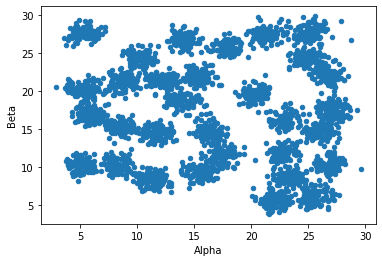

In [22]:
df.plot.scatter('Alpha', 'Beta')
plt.show()

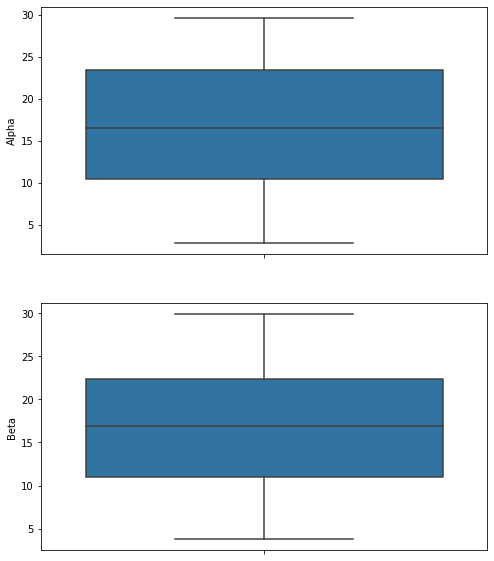

In [38]:
fig, ax = plt.subplots(2, figsize = (8, 10))
sns.boxplot(y = df['Alpha'], ax = ax[0])
sns.boxplot(y = df['Beta'], ax = ax[1])
plt.show()

### Outlier detection using IQR

In [39]:
def outlier_treatment(datacolumn):
    sorted(datacolumn)
    Q1,Q3 = np.percentile(datacolumn , [25,75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range,upper_range

In [40]:
a = set()
for i in df.columns:
    lower, higher = outlier_treatment(df[i])
    l = df.loc[(df[i] < lower) | (df[i] > higher)].index
    for j in list(l):
        a.add(j)    

In [41]:
a

set()

#### No outliers found in the dataset.

### Preprocessing: Scaling attributes. The attributes are pretty much on same scale, nonetheless, standardscaling it to stay on the safer side.

In [42]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

In [43]:
num_pipeline = Pipeline([
        ('std_scaler', StandardScaler()),
    ])

full_pipeline = ColumnTransformer([
        ("num", num_pipeline, df.columns),
    ])

df_scaled = full_pipeline.fit_transform(df)

In [47]:
df_scaled = pd.DataFrame(df_scaled, columns = df.columns)

### Clustering: KMeans and KMedoids, DBSCAN. 
#### Writing a function to perform both clusterings and plot the scatters as well as the silhouette score comparisons to make visualisation and understanding the clusters easier. DBSCAN is done seperately.

In [44]:
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score

In [70]:
def cluster_plots(df_scaled, k_range):
    a = df_scaled.columns[0]
    b = df_scaled.columns[1]
    features = [a, b]
    
    inertia = []
    inertia_medoid = []
    silhouette = []
    silhouette_medoid = []
    for k in k_range:
        
        # KMeans
        
        cls = KMeans(n_clusters = k, random_state = 42)
        cls.fit(df_scaled)
        centroids = cls.cluster_centers_
        u_labels = np.unique(cls.labels_)
        labels = cls.labels_
        
        # KMedoids
        
        cls_medoid = KMedoids(n_clusters = k, random_state = 42)
        cls_medoid.fit(df_scaled)
        centroids_medoid = cls_medoid.cluster_centers_
        u_labels_medoid = np.unique(cls_medoid.labels_)
        labels_medoid = cls_medoid.labels_
        
        fig, axes = plt.subplots(1, 2 , figsize=(20, 7))
        
        # Plotting KMeans
    
        axes[0].scatter(df_scaled[a], df_scaled[b], c = labels.astype(float), edgecolor='face', s = 60)
        axes[0].scatter(cls.cluster_centers_[:, 0], cls.cluster_centers_[:, 1], c = 'white', edgecolor = 'black', linewidth = 2)
        axes[0].set_title("KMeans Clustering: K = {}".format(k), fontsize = 18)
        axes[0].set_xlabel("{}".format(a), fontsize = 18)
        axes[0].set_ylabel("{}".format(b), fontsize = 18)
        axes[0].tick_params(axis='both', labelsize=20)

        # Plotting KMedoids 
        
        axes[1].scatter(df_scaled[a], df_scaled[b], c = labels_medoid.astype(float), edgecolor='face', s = 60)
        axes[1].scatter(cls_medoid.cluster_centers_[:, 0], cls_medoid.cluster_centers_[:, 1], c = 'white', edgecolor = 'black', linewidth = 2)
        axes[1].set_title("KMedoids Clustering: K = {}".format(k), fontsize = 18)
        axes[1].set_xlabel("{}".format(a), fontsize = 18)
        axes[1].set_ylabel("{}".format(b), fontsize = 18)
        axes[1].tick_params(axis='both', labelsize=20)
        
        # Collecting silhouette coefficient for both KMeans and KMedoids
        
        inertia.append(cls.inertia_)
        inertia_medoid.append(cls_medoid.inertia_)
        if k >= 2:
            silhouette.append(silhouette_score(df_scaled, labels, metric='euclidean'))
            silhouette_medoid.append(silhouette_score(df_scaled, labels_medoid, metric='euclidean'))
        else:
            silhouette.append(0)
            silhouette_medoid.append(0)
            

    fig, axes = plt.subplots(1, 2 , figsize=(20, 7))
    x = k_range
    y = inertia
    z = silhouette

    # Plotting Inertia and Silhouette coefficient variation for KMeans
    
    axes[0].plot(x, y, label = "Inertia", color='blue', marker = 'o')
    axes[0].set_title('KMeans Inertia Variation', size = 18)
    axes[0].set_xlabel('Number of Clusters', fontsize = 18)
    axes[0].set_ylabel('Value', fontsize = 18)
    axes[0].legend(fontsize = 20)
    axes[0].tick_params(axis='both', labelsize=20)

    # Plotting Inertia and Silhouette coefficient variation for KMedoids
    
    axes[1].plot(x, z, label = "Silhouette", color='blue', marker = 'o')
    axes[1].set_title('KMeans Silhouette Variation', size = 18)
    axes[1].set_xlabel('Number of Clusters', fontsize = 18)
    axes[1].set_ylabel('Value', fontsize = 18)
    axes[1].legend(fontsize = 20)
    axes[1].tick_params(axis='both', labelsize=20)
    
    fig, axes = plt.subplots(1, 2 , figsize=(20, 7))
    x = k_range
    y = inertia_medoid
    z = silhouette_medoid

    axes[0].plot(x, y, label = "Inertia", color='blue', marker = 'o')
    axes[0].set_title('KMedoids Inertia Variation', size = 18)
    axes[0].set_xlabel('Number of Clusters', fontsize = 18)
    axes[0].set_ylabel('Value', fontsize = 18)
    axes[0].legend(fontsize = 20)
    axes[0].tick_params(axis='both', labelsize=20)

    axes[1].plot(x, z, label = "Silhouette", color='blue', marker = 'o')
    axes[1].set_title('KMedoids Silhouette Variation', size = 18)
    axes[1].set_xlabel('Number of Clusters', fontsize = 18)
    axes[1].set_ylabel('Value', fontsize = 18)
    axes[1].legend(fontsize = 20)
    axes[1].tick_params(axis='both', labelsize=20)

In [71]:
k_range = np.arange(1, 60, 3)

#### As we estimate the ideal value of K to be between 30-40(since total tuples is 3100), we are trying K values between 1 and 3 with a step size of 3.

<ipython-input-70-ab836331ad00>:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, 2 , figsize=(20, 7))


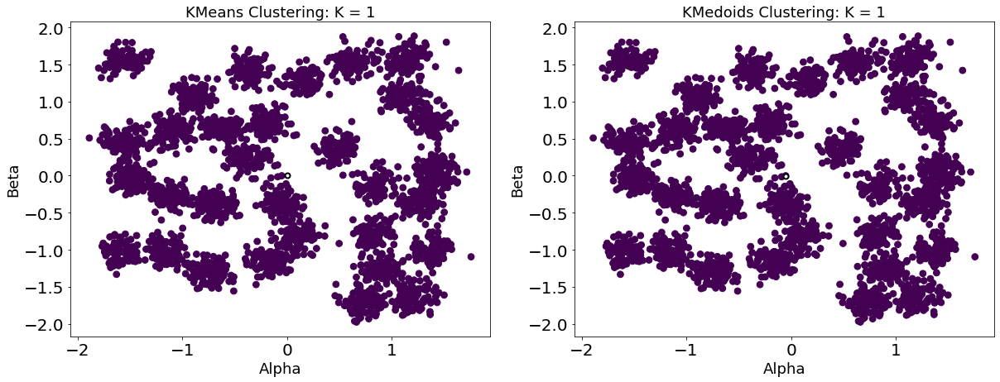

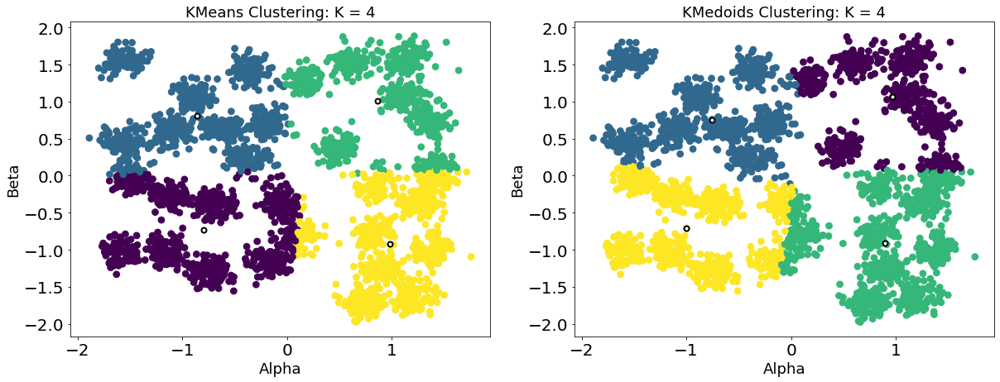

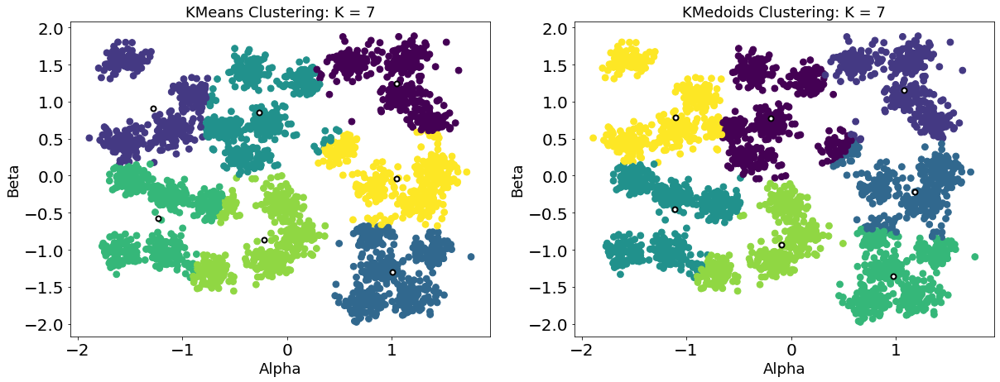

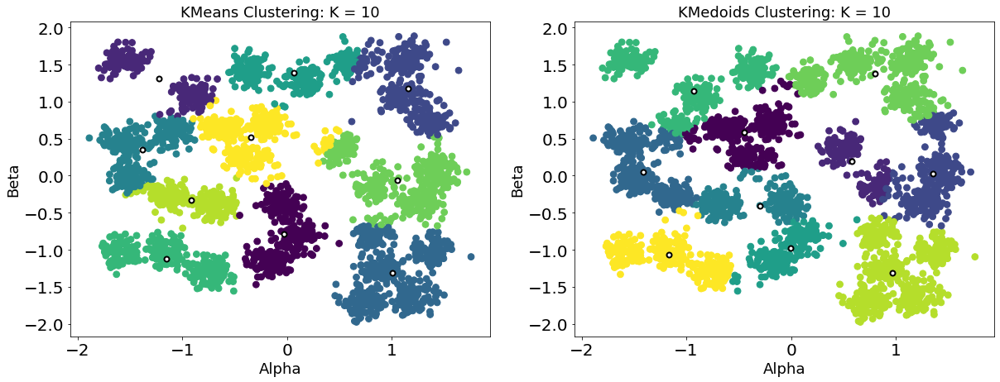

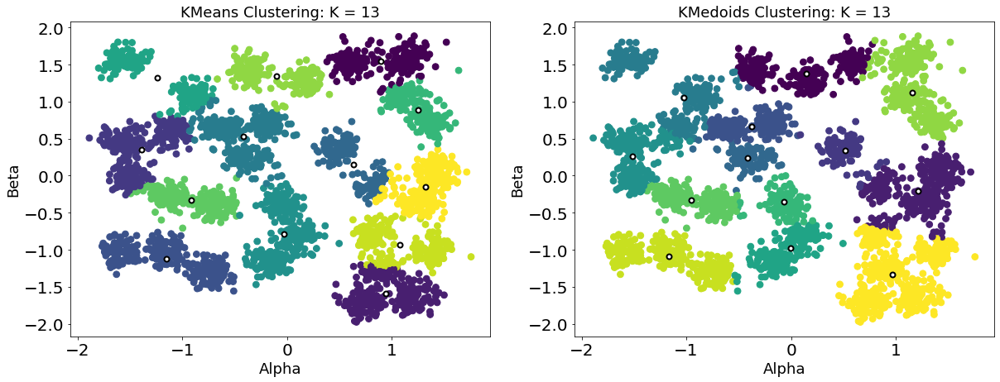

...

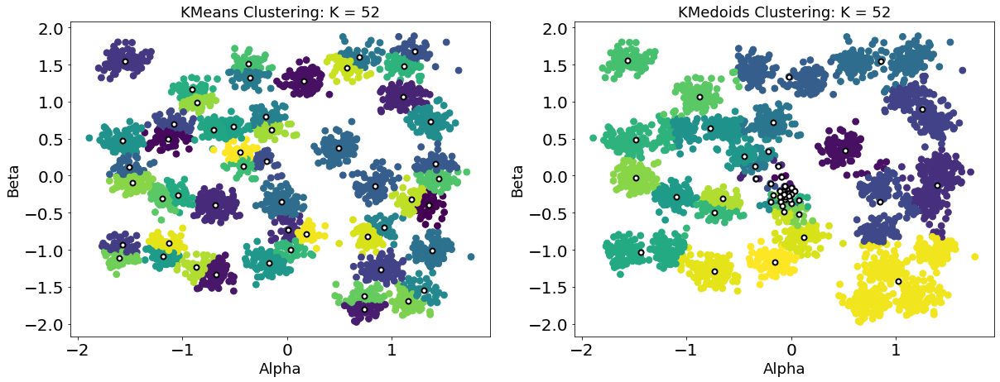

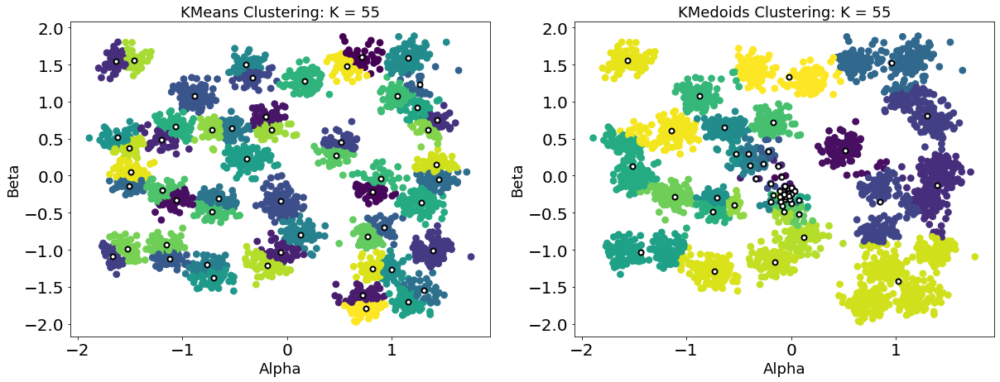

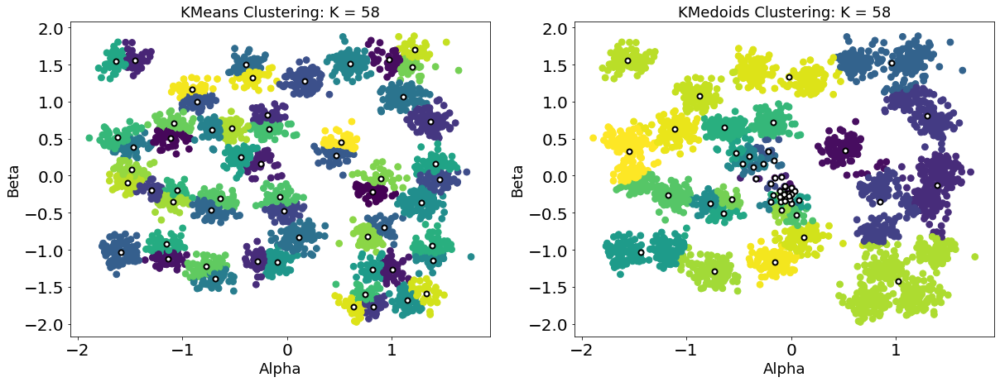

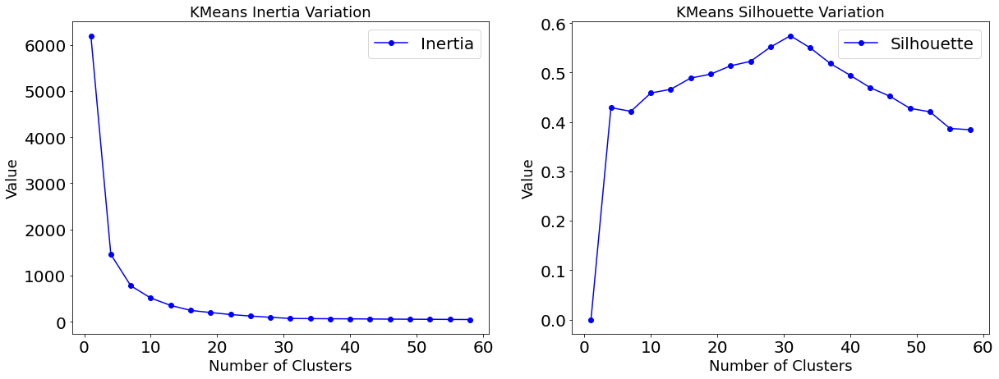

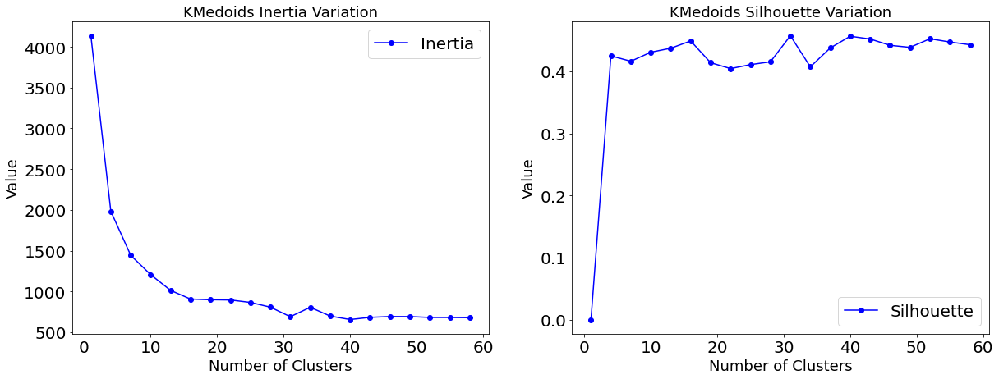

In [73]:
cluster_plots(df_scaled, k_range)

### Comments:

1. Above plots make it easy to compare KMeans and KMedoids side by side for different values of K.
2. KMeans shows best clustering around K = 31, as can be seen visually. 
3. KMedoids shows best clustering for similar values of K.
4. KMeans seems to perform better than KMedoids.
5. This might be due to how the dataset is. There are no minor outliers. The data is spread out in nice near circular clusters with decent definitions.
6. Given these points, a measure of center, as is used in KMeans through the Euclidean distance, seems to be working well.
7. Our visual observations are further confirmed using the inertial and silhouette plots.
8. Inertia elbow shows significant increase till K = 10 for KMeans as well as KMedoids. The increase in cluster formation efficiency reduces after this.
9. Silhouette coefficient indicates that the best K value  = 31/32 for both KMeans and KMedoids, just as we visually observed.
10. The Silhoutte coefficient is best for KMeans at almost 0.6 for K = 31 while it is around 0.45 for KMedoids for same value of K.
11. Therefore, for clustering this dataset, between these 2, we should choose KMeans algorithm with K = 31 for best and most cohesive, well defined clusters.
12. The clusters formed are of good quality but not the best as based on the silhouette coefficient obtained.

### DBSCAN

In [74]:
from sklearn.cluster import DBSCAN

In [122]:
eps_list = np.arange(0.1, 0.4, 0.1) # after some initial trial and error, eps chosen between 0.1 and 0.4
min_samples_list = np.arange(1, 100, 5) # after some initial trial and error min_samples choses between 1 and 100 with step size of 5.

In [116]:
import math
silhouette_main = []
def dbscan_plotter(df_Scaled, a, b):
    height = math.ceil(len(eps_list) * len(min_samples_list) / 4)
    fig, axes = plt.subplots(height, 4, figsize = (25, height * 10))
    m = 0
    n = 0
#     silhouette = []
    x = []
    k = 1
#     silhouette_main = []

    for i in eps_list:
        i = round(i, 1)
        silhouette = []
        for j in min_samples_list:
            clus = DBSCAN(eps = i, min_samples = j)
            clus.fit_predict(df_Scaled)
            labels = clus.labels_

            if len(np.unique(labels)) >= 2:
                silhouette.append(silhouette_score(df_Scaled, labels, metric='euclidean'))
            else:
                silhouette.append(0)        

            x.append(k)
            k = k + 1

            axes[m, n].scatter(df_Scaled['Alpha'], df_Scaled['Beta'], c = labels.astype(float), edgecolor='face', s = 60)
            axes[m, n].set_title("eps = {}, min_samples = {}".format(i, j), fontsize = 18)
            axes[m, n].set_xlabel("{}".format(a), fontsize = 18)
            axes[m, n].set_ylabel("{}".format(b), fontsize = 18)
            axes[m, n].tick_params(axis='both', labelsize=20)

            if n < 3:
                n += 1
            else:
                n = 0
                m += 1
                
        silhouette_main.append(silhouette)
        silhoutte = list()

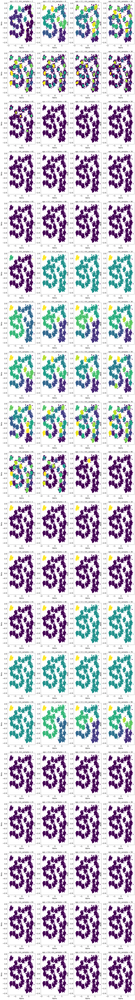

In [117]:
dbscan_plotter(df_scaled, 'Alpha', 'Beta')

In [119]:
def dbscan_sil_plot():
    plt.show()
    plt.close()
#     plt.figure(figsize = (20, 15))
    
    for i in range(4):
        plt.plot(min_samples_list, silhouette_main[i], label = "Silhouette", color='blue', marker = 'o')
        plt.title('DBScan Silhouette Variation, eps = {}'.format(eps_list[i]), size = 18)
        plt.xlabel('Min_Samples', fontsize = 18)
        plt.ylabel('Silhouette Coefficient', fontsize = 18)
        plt.legend(fontsize = 20)
        plt.tick_params(axis='both', labelsize=20)
        plt.show()
        
    plt.close()

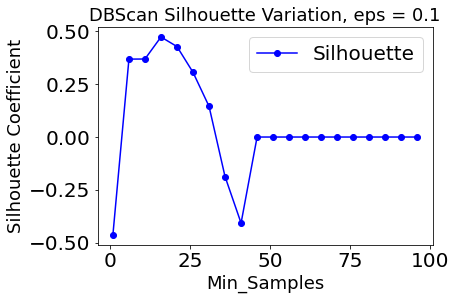

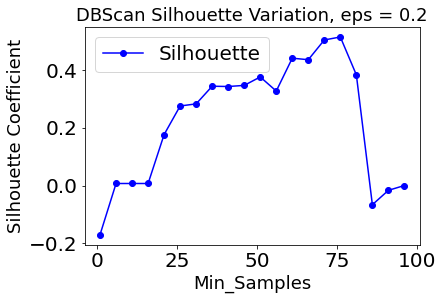

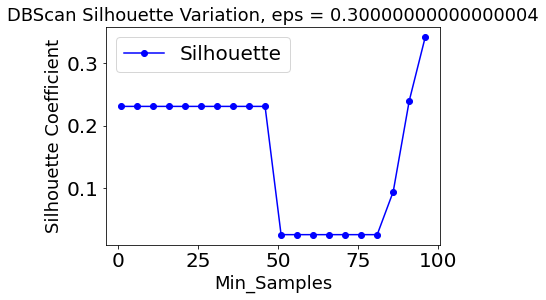

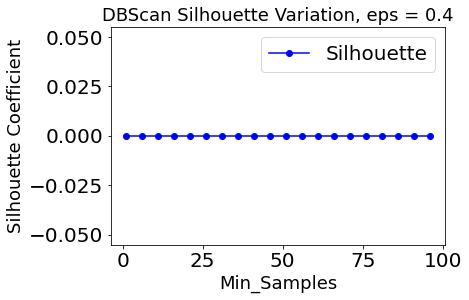

In [120]:
dbscan_sil_plot()

### Comments:

1. DBSCAN does not seem to work as good with this dataset as KMeans, but shows similar or slightly better than KMedoids for some values. 
2. This is possibly due to the type and distribution of the data. 
3. All in all, the best clustering result is observed for eps = 0.1 and min_samples = approximately 20. This gives a silhouette score of 0.5. 
4. For eps = 0.2, best score of 0.45 is achieved for min_samples around 75.
5. For eps = 0.3, initially the coefficient is low and shows signs of improvement for min_values beyond 100. This can be further checked.
6. eps = 0.4 is not suitable it seems. 
5. While DBSCAN does good in some parameter specifications, KMeans is likely to be the best algorithm for this dataset as we initially suspected.
6. The clusters are of moderate quality, based on the silhouette coefficient.

### End time

In [123]:
print("End Time: ", datetime.datetime.now())

End Time:  2021-05-31 10:34:21.265297
